# App Rating Predictor
## Building an app rating predictor using data scraped from the android market
### We have scraped some apps from the Google PlayStore, and the primary goals of our project are:
- predict the rating
- predict installation count
- predict whether the app is free or paid 
- predict whether is it ad-supported

But before we start with the explanatory data analysis, we need to do data cleaning/preprocessing because our dataset is VERY UNSTRUCTURED and RAW.

# Table of contents
1. <a href='#memory optimization'>Memory optimization</a>
2. [EDA](#EDA) 
3. <a href='#max installs EDA'>MAX INSTALLS EDA</a>
4. <a href='#rating EDA'>RATING EDA</a>  
5. <a href='#category EDA'>CATEGORY EDA</a>  
6. <a href='#review count EDA'>REVIEW COUNT EDA</a>  
7. <a href='#size EDA'>SIZE EDA</a>  
8. <a href='#singapore EDA'>Singapore EDA</a>
9. <a href='#fang EDA'>FANG EDA</a>
10. <a href='#geospatial analysis'>Geospatial analysis</a>




### Import packages

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import seaborn as sb
sb.set() # set the default Seaborn style for graphics
pd.set_option('max_columns', None) #Show all columns, or else some will just be "..."

import plotly.express as px # shows basic statistics of the figure
from dython import nominal # Use for calculating correlation between variables. Including between categorical and numerical variables
import matplotlib.pyplot as plt # we only need pyplot

import plotly.graph_objects as go # Used as trace for subplots
from plotly.subplots import make_subplots

In [2]:
df = pd.read_csv("./google_app_scrap.csv")
df.head()

,Unnamed: 0,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,CURRENCY,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,FAMILY_GENRE,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,0,Skincare Routine,4.510000,Beauty,topselling_paid,609.0,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,USD,16M,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,NaN,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13176.0,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,USD,24M,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,NaN,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782877.0,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,USD,201M,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,NaN,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,95.0,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,USD,67M,Glowbe LTD,"4103, Limassol Cyprus",Everyone,NaN,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,4,PhiApp,4.233333,Beauty,topgrossing,916.0,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,USD,Varies with device,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,NaN,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


# Data Cleaning

In [3]:
df.describe(include="all")

,Unnamed: 0,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,CURRENCY,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,FAMILY_GENRE,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
count,23952.00000,23952,23934.000000,23952,23952,2.393400e+04,2.395200e+04,2.395200e+04,2.395200e+04,2.395200e+04,2.395200e+04,2.393400e+04,23952,2.395200e+04,2.395200e+04,23952,23952.000000,23952,23952,23952,19420,23952,0.0,23952,23952,23952,23762,23952,23952
unique,NaN,18496,NaN,48,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22,NaN,NaN,2,NaN,1,666,12343,8614,5,NaN,2,2,2,3935,1600,1
top,NaN,Solitaire,NaN,Sports,topselling_free,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"1,000,000+",NaN,NaN,True,NaN,USD,Varies with device,My Town Games Ltd,"Ha-Rekhev St 1, Tel Aviv-Yafo",Everyone,NaN,False,True,False,"Feb 21, 2022",4/3/22,8/3/22
freq,NaN,27,NaN,944,10593,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4427,NaN,NaN,18520,NaN,23952,3170,137,137,17530,NaN,12182,14509,23439,44,955,23952
mean,11975.50000,NaN,3.988836,NaN,NaN,3.899129e+05,4.401561e+04,9.365627e+03,1.810578e+04,4.228248e+04,2.758255e+05,1.778189e+04,NaN,1.891777e+07,3.073138e+07,NaN,1.422892,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,6914.49116,NaN,1.044631,NaN,NaN,3.676933e+06,7.961011e+05,1.007322e+05,1.726730e+05,3.569045e+05,2.428996e+06,1.179491e+05,NaN,2.201441e+08,2.802337e+08,NaN,8.832669,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.00000,NaN,0.000000,NaN,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.000000e+00,0.000000e+00,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,5987.75000,NaN,3.891892,NaN,NaN,6.412500e+02,5.800000e+01,1.200000e+01,2.300000e+01,5.100000e+01,3.927500e+02,6.400000e+01,NaN,5.000000e+04,5.644300e+04,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,11975.50000,NaN,4.300697,NaN,NaN,8.450000e+03,6.805000e+02,1.900000e+02,3.470000e+02,7.885000e+02,5.698000e+03,5.750000e+02,NaN,5.000000e+05,8.288390e+05,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,17963.25000,NaN,4.561213,NaN,NaN,7.308575e+04,5.809500e+03,1.719250e+03,3.201000e+03,7.650000e+03,5.187900e+04,4.237750e+03,NaN,5.000000e+06,7.747612e+06,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23952 entries, 0 to 23951
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         23952 non-null  int64  
 1   APP_NAME           23952 non-null  object 
 2   RATING             23934 non-null  float64
 3   CATEGORY           23952 non-null  object 
 4   COLLECTIONS        23952 non-null  object 
 5   RATING_COUNT       23934 non-null  float64
 6   1_STAR_RATINGS     23952 non-null  int64  
 7   2_STAR_RATINGS     23952 non-null  int64  
 8   3_STAR_RATINGS     23952 non-null  int64  
 9   4_STAR_RATINGS     23952 non-null  int64  
 10  5_STAR_RATINGS     23952 non-null  int64  
 11  REVIEW_COUNT       23934 non-null  float64
 12  INSTALLS           23952 non-null  object 
 13  MIN_INSTALLS       23952 non-null  int64  
 14  MAX_INSTALLS       23952 non-null  int64  
 15  FREE               23952 non-null  bool   
 16  PRICE              239

Some initial observations:
1. UNNAMED: 0 column is same as the index
2. There are no values in FAMILY_GENRE
3. All the values in CURRENCY are the same (usd) which indicates the currency of the price of the app
4. The 5 n_STAR_RATING columns does not always sum up to RATING_COUNT
5. SIZE contains string objects with postfix of K, M, G to indicate the size of the app in bytes
6. The formats for columns with date objects are inconsistent

### Remove useless columns that contain same/empty values which won't contribute to our EDA
We will remove:
- `FAMILY_GENRE`
- `Unnamed: 0`
- `CURRENCY`

In [5]:
df = df.drop(columns=['Unnamed: 0', 'FAMILY_GENRE', 'CURRENCY'])
df.columns

Index(['APP_NAME', 'RATING', 'CATEGORY', 'COLLECTIONS', 'RATING_COUNT',
       '1_STAR_RATINGS', '2_STAR_RATINGS', '3_STAR_RATINGS', '4_STAR_RATINGS',
       '5_STAR_RATINGS', 'REVIEW_COUNT', 'INSTALLS', 'MIN_INSTALLS',
       'MAX_INSTALLS', 'FREE', 'PRICE', 'SIZE', 'DEVELOPER',
       'DEVELOPER_ADDRESS', 'CONTENT_RATING', 'AD_SUPPORTED',
       'IN_APP_PURCHASES', 'EDITORS_CHOICE', 'RELEASED_DATE', 'LAST_UPDATED',
       'DAY_SCRAPED'],
      dtype='object')

### Tidy up `RATING_COUNT`
RATING_COUNT is inconsistent. So we will replace the values in `RATING_COUNT` with the sum of `1_STAR_RATING`, `2_STAR_RATING`, `3_STAR_RATING`, `4_STAR_RATING`, `5_STAR_RATING`.

In [6]:
df['RATING_COUNT'] = df[['1_STAR_RATINGS', '2_STAR_RATINGS', '3_STAR_RATINGS', '4_STAR_RATINGS', '5_STAR_RATINGS']].sum(axis=1)
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16M,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24M,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201M,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67M,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,Varies with device,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


### Clean `SIZE`
`SIZE` are string objects, we will convert them into integers for integer operations in EDA. <br>
For example: 12M -> 12000000, 12K -> 12000, varies with device -> NaN (handle this later)

In [7]:
df["SIZE"] = df["SIZE"].str.replace("Varies with device","-1") #replacing "Varies with device" with -1 
df["SIZE"] = df["SIZE"].str.replace(",","") #replacing ',' with an empty string

#changing k to (10**3), M to (10**6) and G to (10**9)
df["SIZE"] = (df["SIZE"].replace(r'[kMG]+$', '', regex=True).astype(float) * \
                   df["SIZE"].str.extract(r'[\d\.]+([kMG]+)', expand=False)
                   .fillna(1)
                   .replace(['k','M','G'], [10**3, 10**6,10**9]).astype(int))
df['SIZE'] = df['SIZE'].astype('int64') #converting float to int64
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,-1,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


Convert all **-1 to NaN**, we will fill this later

In [8]:
df.loc[df['SIZE'] == -1, 'SIZE'] = np.nan
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,"Aug 13, 2018",14/2/22,8/3/22
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,"May 22, 2014",3/3/22,8/3/22
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,"Feb 19, 2013",4/3/22,8/3/22
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,"Dec 2, 2020",20/2/22,8/3/22
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,NaN,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,"Mar 13, 2015",20/1/22,8/3/22


### Reformat dates

`RELEASED_DATE`, `LAST_UPDATED`, `DAY_SCRAPED` are string objects, and their format are inconsistent and different. Hence, we will reformat them into **"dd/mm/yyyy"**.

In [9]:
#Convert strings to datetime
df['RELEASED_DATE'] = pd.to_datetime(df['RELEASED_DATE'])
df['LAST_UPDATED'] = pd.to_datetime(df['LAST_UPDATED'], format="%d/%m/%y")
df['DAY_SCRAPED'] = pd.to_datetime(df['DAY_SCRAPED'], format="%d/%m/%y")

#reformat date
df['RELEASED_DATE'] = df['RELEASED_DATE'].dt.strftime('%d/%m/%Y')
df['LAST_UPDATED'] = df['LAST_UPDATED'].dt.strftime('%d/%m/%Y')
df['DAY_SCRAPED'] = df['DAY_SCRAPED'].dt.strftime('%d/%m/%Y')
df.head()

,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED
0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,13/08/2018,14/02/2022,08/03/2022
1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,22/05/2014,03/03/2022,08/03/2022
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,19/02/2013,04/03/2022,08/03/2022
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,02/12/2020,20/02/2022,08/03/2022
4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,NaN,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,13/03/2015,20/01/2022,08/03/2022


### Dealing with NULL values

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23952 entries, 0 to 23951
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   APP_NAME           23952 non-null  object 
 1   RATING             23934 non-null  float64
 2   CATEGORY           23952 non-null  object 
 3   COLLECTIONS        23952 non-null  object 
 4   RATING_COUNT       23952 non-null  int64  
 5   1_STAR_RATINGS     23952 non-null  int64  
 6   2_STAR_RATINGS     23952 non-null  int64  
 7   3_STAR_RATINGS     23952 non-null  int64  
 8   4_STAR_RATINGS     23952 non-null  int64  
 9   5_STAR_RATINGS     23952 non-null  int64  
 10  REVIEW_COUNT       23934 non-null  float64
 11  INSTALLS           23952 non-null  object 
 12  MIN_INSTALLS       23952 non-null  int64  
 13  MAX_INSTALLS       23952 non-null  int64  
 14  FREE               23952 non-null  bool   
 15  PRICE              23952 non-null  float64
 16  SIZE               207

By observation and previous cleaning steps, there are 6 columns with NULL values which are:
- REVIEW_COUNT
- RATING
- RATING_COUNT
- RELEASED_DATE
- SIZE
- DEVELOPER_ADDRESS 

For `REVIEW_COUNT`, `RATING`, `RATING_COUNT`, the values are null value most likely because the app is too new and no customers have done any review on them, so **remove rows with NULL column values** from the dataset.

In [11]:
df = df.dropna(axis=0, subset=['REVIEW_COUNT', 'RATING', 'RATING_COUNT'])
df = df.reset_index()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23934 entries, 0 to 23933
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   index              23934 non-null  int64  
 1   APP_NAME           23934 non-null  object 
 2   RATING             23934 non-null  float64
 3   CATEGORY           23934 non-null  object 
 4   COLLECTIONS        23934 non-null  object 
 5   RATING_COUNT       23934 non-null  int64  
 6   1_STAR_RATINGS     23934 non-null  int64  
 7   2_STAR_RATINGS     23934 non-null  int64  
 8   3_STAR_RATINGS     23934 non-null  int64  
 9   4_STAR_RATINGS     23934 non-null  int64  
 10  5_STAR_RATINGS     23934 non-null  int64  
 11  REVIEW_COUNT       23934 non-null  float64
 12  INSTALLS           23934 non-null  object 
 13  MIN_INSTALLS       23934 non-null  int64  
 14  MAX_INSTALLS       23934 non-null  int64  
 15  FREE               23934 non-null  bool   
 16  PRICE              239

As for `RELEASED_DATE`, fill the **null values with the median**.

But first we create to new columns to replace `RELEASED_DATE` and `LAST_UPDATED` to contain numerical values instead of Date object.

In [12]:
for i in range(df.shape[0]):
    if (pd.isnull(df.loc[i, "LAST_UPDATED"])):
        df.loc[i, "DAYS_SINCE_UPDATE"] = np.nan
        continue
    date_from = pd.to_datetime(df.loc[i, "LAST_UPDATED"], format="%d/%m/%Y").date()
    date_till = pd.to_datetime(df.loc[i, "DAY_SCRAPED"], format="%d/%m/%Y").date()
    date_elasped = np.int64((date_till-date_from).days)
    df.loc[i, "DAYS_SINCE_UPDATE"] = date_elasped
    
    if (pd.isnull(df.loc[i, "RELEASED_DATE"])):
        df.loc[i, "DAYS_SINCE_RELEASED"] = np.nan
        continue
    
    date_from = pd.to_datetime(df.loc[i, "RELEASED_DATE"], format="%d/%m/%Y").date()
    date_till = pd.to_datetime(df.loc[i, "DAY_SCRAPED"], format="%d/%m/%Y").date()
    date_elasped = np.int64((date_till-date_from).days)
    df.loc[i, "DAYS_SINCE_RELEASED"] = date_elasped
    
df.head()

,index,APP_NAME,RATING,CATEGORY,COLLECTIONS,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MIN_INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,RELEASED_DATE,LAST_UPDATED,DAY_SCRAPED,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,0,Skincare Routine,4.510000,Beauty,topselling_paid,598,34,11,23,65,465,89.0,"10,000+",10000,17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,13/08/2018,14/02/2022,08/03/2022,22.0,1303.0
1,1,Booksy Biz: For Businesses,4.313544,Beauty,topgrossing,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1000000,1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,22/05/2014,03/03/2022,08/03/2022,5.0,2847.0
2,2,Perfect365 Makeup Photo Editor,4.295216,Beauty,topgrossing,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",50000000,54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,19/02/2013,04/03/2022,08/03/2022,4.0,3304.0
3,3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,topgrossing,93,38,6,0,2,47,29.0,"10,000+",10000,29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,02/12/2020,20/02/2022,08/03/2022,16.0,461.0
4,4,PhiApp,4.233333,Beauty,topgrossing,914,122,15,61,45,671,26.0,"100,000+",100000,302978,True,0.00,NaN,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,13/03/2015,20/01/2022,08/03/2022,47.0,2552.0


Fill na values with the median

In [13]:
median_dsr = df["DAYS_SINCE_RELEASED"].median()
median_dsu = df["DAYS_SINCE_UPDATE"].median()
median_size = df["SIZE"].median()
df["DAYS_SINCE_RELEASED"].fillna(median_dsr, inplace=True)
df["DAYS_SINCE_UPDATE"].fillna(median_dsu, inplace=True)
df["SIZE"].fillna(median_size, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23934 entries, 0 to 23933
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   index                23934 non-null  int64  
 1   APP_NAME             23934 non-null  object 
 2   RATING               23934 non-null  float64
 3   CATEGORY             23934 non-null  object 
 4   COLLECTIONS          23934 non-null  object 
 5   RATING_COUNT         23934 non-null  int64  
 6   1_STAR_RATINGS       23934 non-null  int64  
 7   2_STAR_RATINGS       23934 non-null  int64  
 8   3_STAR_RATINGS       23934 non-null  int64  
 9   4_STAR_RATINGS       23934 non-null  int64  
 10  5_STAR_RATINGS       23934 non-null  int64  
 11  REVIEW_COUNT         23934 non-null  float64
 12  INSTALLS             23934 non-null  object 
 13  MIN_INSTALLS         23934 non-null  int64  
 14  MAX_INSTALLS         23934 non-null  int64  
 15  FREE                 23934 non-null 

Drop `RELEASED_DATE`, `LAST_UPDATED`, `DAY_SCRAPED`, `COLLECTIONS`, and `MIN_INSTALLS` because we dont need them anymore

In [14]:
df = df.drop(columns=['RELEASED_DATE', 'LAST_UPDATED', 'DAY_SCRAPED', 'COLLECTIONS', 'MIN_INSTALLS'])
df.columns

Index(['index', 'APP_NAME', 'RATING', 'CATEGORY', 'RATING_COUNT',
       '1_STAR_RATINGS', '2_STAR_RATINGS', '3_STAR_RATINGS', '4_STAR_RATINGS',
       '5_STAR_RATINGS', 'REVIEW_COUNT', 'INSTALLS', 'MAX_INSTALLS', 'FREE',
       'PRICE', 'SIZE', 'DEVELOPER', 'DEVELOPER_ADDRESS', 'CONTENT_RATING',
       'AD_SUPPORTED', 'IN_APP_PURCHASES', 'EDITORS_CHOICE',
       'DAYS_SINCE_UPDATE', 'DAYS_SINCE_RELEASED'],
      dtype='object')

### Dealing with Addresses

The raw address of developers might be hard to use for eda, we will generate a new feature `COUNTRY` that holds the country the developer originated.

First, import the dataset of predicted country of each developer address that we generated using **Google Maps API**.

In [15]:
country_df = pd.read_csv("developer_country.csv")
country_df.head()

,index,DEVELOPER_ADDRESS,COUNTRY
0,0,23 Stoneleigh Avenue\nBN1 8NP,United Kingdom
1,1,"ul. Łucka 2/4/6, lok. U 4,\n00-845 Warsaw\nPoland",Poland
2,2,"Perfect365, Inc.\n101 Jefferson Drive\nMenlo P...",Usa
3,3,"4103, Limassol Cyprus",Cyprus
4,4,"Gartengasse 8/8\n1050, Vienna\nAustria",Austria


Remove # from each row in `DEVELOPER_ADDRESS` column to match the format of mapping in the country_df

In [16]:
df = df.drop(["index"], axis = 1)
for i in range(df.shape[0]):
    developer_addr = df.loc[i, "DEVELOPER_ADDRESS"]
    if (pd.isnull(developer_addr)):
        continue
    df.loc[i, "DEVELOPER_ADDRESS"] = developer_addr.replace("#", " ")
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,Skincare Routine,4.510000,Beauty,598,34,11,23,65,465,89.0,"10,000+",17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,22.0,1303.0
1,Booksy Biz: For Businesses,4.313544,Beauty,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,5.0,2847.0
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,4.0,3304.0
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,93,38,6,0,2,47,29.0,"10,000+",29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,16.0,461.0
4,PhiApp,4.233333,Beauty,914,122,15,61,45,671,26.0,"100,000+",302978,True,0.00,45000000.0,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,47.0,2552.0


Map the `DEVELOPER_ADDRESS` to its country 

In [17]:
df['COUNTRY']=df[['DEVELOPER_ADDRESS']].merge(country_df,how='left').COUNTRY
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,COUNTRY
0,Skincare Routine,4.510000,Beauty,598,34,11,23,65,465,89.0,"10,000+",17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,False,False,22.0,1303.0,NaN
1,Booksy Biz: For Businesses,4.313544,Beauty,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,True,False,5.0,2847.0,NaN
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,True,False,4.0,3304.0,NaN
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,93,38,6,0,2,47,29.0,"10,000+",29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,True,False,16.0,461.0,Cyprus
4,PhiApp,4.233333,Beauty,914,122,15,61,45,671,26.0,"100,000+",302978,True,0.00,45000000.0,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,True,False,47.0,2552.0,NaN


Reposition the `COUNTRY` column

In [18]:
df.insert(19, 'COUNTRY', df.pop('COUNTRY'))
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,Skincare Routine,4.510000,Beauty,598,34,11,23,65,465,89.0,"10,000+",17616,False,3.99,16000000.0,Mento Apps Ltd,23 Stoneleigh Avenue\r\nBN1 8NP,Everyone,False,NaN,False,False,22.0,1303.0
1,Booksy Biz: For Businesses,4.313544,Beauty,13170,1587,365,464,659,10095,1920.0,"1,000,000+",1270756,True,0.00,24000000.0,Booksy International sp. z o.o.,"ul. Łucka 2/4/6, lok. U 4,\r\n00-845 Warsaw\r\...",Teen,False,NaN,True,False,5.0,2847.0
2,Perfect365 Makeup Photo Editor,4.295216,Beauty,782867,62917,22800,55202,121258,520690,49923.0,"50,000,000+",54737806,True,0.00,201000000.0,"Perfect365, Inc.","Perfect365, Inc.\r\n101 Jefferson Drive\r\nMen...",Everyone,True,NaN,True,False,4.0,3304.0
3,Glowbe – Face Yoga & Exercise,3.136364,Beauty,93,38,6,0,2,47,29.0,"10,000+",29466,True,0.00,67000000.0,Glowbe LTD,"4103, Limassol Cyprus",Everyone,False,Cyprus,True,False,16.0,461.0
4,PhiApp,4.233333,Beauty,914,122,15,61,45,671,26.0,"100,000+",302978,True,0.00,45000000.0,PhiAcademy GmbH,"Gartengasse 8/8\r\n1050, Vienna\r\nAustria",Everyone,False,NaN,True,False,47.0,2552.0


In [19]:
df["COUNTRY"].describe()

count     6806
unique      97
top        Usa
freq      1463
Name: COUNTRY, dtype: object

There are 16263 apps with predicted developer country, which means around 4000 apps do not have predicted country/registered country.

We will only drop them in model building later.

### Sort the dataset by the `APP_NAME`

In [20]:
df.sort_values("APP_NAME", inplace = True)
df.reset_index(inplace=True)
df.drop(["index"], axis=1, inplace=True)
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Everyone,False,Usa,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,Everyone,False,NaN,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,Everyone,True,NaN,True,False,4.0,1084.0
3,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,Everyone,True,NaN,True,False,4.0,1084.0
4,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",Teen,False,NaN,True,False,952.0,1275.0


### Drop duplicated apps that has different categories, but turn their `CATEGORY` column into a String(array) 

In [21]:
temp_df = df.groupby("APP_NAME")["CATEGORY"].apply(list)
df.drop_duplicates(subset ="APP_NAME", keep = "first", inplace = True)
df.reset_index(inplace=True)
df.drop(["index"], axis = 1, inplace= True)
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Everyone,False,Usa,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,Everyone,False,NaN,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,Everyone,True,NaN,True,False,4.0,1084.0
3,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",Teen,False,NaN,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,Dating,708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,Mature 17+,False,NaN,True,False,17.0,1026.0


In [22]:
i = 0
for tags in temp_df:
    to_add = []
    [to_add.append(x) for x in tags if x not in to_add]
    df.loc[i, "CATEGORY"] = str(to_add)
    i+=1
df.head() 

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,['Lifestyle'],68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Everyone,False,Usa,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,['Puzzle'],975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,Everyone,False,NaN,False,False,0.0,945.0
2,#DRIVE,4.434152,['Racing'],229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,Everyone,True,NaN,True,False,4.0,1084.0
3,#SelfCare,4.463476,['Role Playing'],14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",Teen,False,NaN,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,['Dating'],708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,Mature 17+,False,NaN,True,False,17.0,1026.0


In [23]:
df = df[df["RATING_COUNT"] != 0]
df.reset_index(inplace=True)
df.drop(["index"], axis = 1, inplace= True)
df

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,['Lifestyle'],68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Everyone,False,Usa,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,['Puzzle'],975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,Everyone,False,NaN,False,False,0.0,945.0
2,#DRIVE,4.434152,['Racing'],229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,Everyone,True,NaN,True,False,4.0,1084.0
3,#SelfCare,4.463476,['Role Playing'],14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",Teen,False,NaN,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,['Dating'],708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,Mature 17+,False,NaN,True,False,17.0,1026.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17465,투믹스,2.986667,['Comics'],6057,1777,646,1050,1050,1534,56.0,"1,000,000+",1834618,True,0.00,14000000.0,(주)투믹스,"서울특별시 강남구 테헤란로 98길 8, 4층(대치동, KT&G 대치타워)",Teen,False,NaN,True,False,12.0,1913.0
17466,피망 뉴맞고: 고스톱 대표 맞고 게임,3.840278,['Card'],352939,68709,19525,14582,46465,203658,691.0,"10,000,000+",10454514,True,0.00,85000000.0,NEOWIZ corp,경기도 성남시 분당구 대왕판교로 645번길 14 네오위즈판교타워,Teen,True,South Korea,True,False,21.0,3186.0
17467,허기 워기,4.200000,['Music'],717,143,0,0,0,574,5.0,"100,000+",200717,True,0.00,49000000.0,Dark Horror Game,NaN,Everyone,True,NaN,False,False,100.0,101.0
17468,ﺷﺎﻫﺪ - Shahid,3.733209,['Entertainment'],630347,164347,17917,24095,39100,384888,6188.0,"50,000,000+",91701800,True,0.00,14000000.0,MBC Group,"DMC3,\r\nDubai Media City,\r\nDubai, UAE",Everyone,True,NaN,True,False,1.0,2050.0


In [24]:
count = 0
hashMap = {}
for i in range(df.shape[0]):
    temp = list(df.loc[i, "CATEGORY"].split(","))
    num_of_categories = len(temp)
    if (num_of_categories not in hashMap):
        hashMap[num_of_categories] = 1
    else:
        hashMap[num_of_categories] +=1
# iterate hashmap
for k, v in hashMap.items():
    print(k, v)

1 17446
2 23
4 1


The above numbers shown are the number of apps for each category count.

### Modify `CATEGORY` column

In [25]:
for i in range(df.shape[0]):
    temp = list(df.loc[i, "CATEGORY"].split(","))
    num_of_categories = len(temp)
    if (num_of_categories == 4):
        app_with_four_cat = pd.DataFrame(df.loc[i, ])
        break
app_with_four_cat

,6402
APP_NAME,HD Video Screen Mirroring
RATING,1.717949
CATEGORY,"['Tools', 'Entertainment', 'Dating', 'Social']"
RATING_COUNT,494
1_STAR_RATINGS,382
2_STAR_RATINGS,12
3_STAR_RATINGS,25
4_STAR_RATINGS,12
5_STAR_RATINGS,63
REVIEW_COUNT,32.0


We will handle the apps that belongs to more than 1 category (Pick one of the category of the 2, we drop the one with 4 category since its stats doesnt matter anyways)

In [26]:
count = 0
sanity_check_df = []
for i in range(df.shape[0]):
    temp = list(df.loc[i, "CATEGORY"].split(","))
    num_of_categories = len(temp)
    if (num_of_categories == 2):
        df.loc[i, "CATEGORY"] = str(temp[0])
        sanity_check_df.append(df.loc[i, ])
        count +=1
print("There are", count, "apps that belongs to more than one category.")
sanity_check_df = pd.DataFrame(sanity_check_df)
sanity_check_df

There are 23 apps that belongs to more than one category.


,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
1318,Ball Sort - Color Puzzle Game,4.705883,['Puzzle',1256,42,42,20,30,1122,334.0,"100,000+",245339,True,0.0,48000000.0,EasyFun Game,"21 CANTON RD, TSIM SHA TSUI, HONG KONG",Everyone,True,Hong Kong,True,False,8.0,162.0
1350,Barcode Scanner,4.592179,['Libraries & Demo',9765,488,162,325,873,7917,652.0,"1,000,000+",1648889,True,0.0,8800000.0,Cognex Corporation,"One Vision Drive\r\nNatick, MA 01760-2059\r\n",Everyone,False,NaN,False,False,35.0,3660.0
1580,Bible Trivia,4.791666,['Trivia',4024,0,53,138,390,3443,529.0,"100,000+",228494,True,0.0,24000000.0,Christian Games,19 Whittle house\r\nCAMBRIDGE\r\nCB29AP\r\nUni...,Everyone,True,NaN,True,False,171.0,1051.0
2088,Bubble Shooter,4.605145,['Puzzle',40349,1263,766,2074,4423,31823,2835.0,"5,000,000+",9390667,True,0.0,45000000.0,Mouse Games,"Osiris International Cayman Limited, Suite 4-...",Everyone,True,United Kingdom,False,False,17.0,659.0
2156,Business Card Scanner & Reader,4.720000,['Productivity',3209,31,31,95,480,2572,247.0,"100,000+",221224,True,0.0,23000000.0,Covve Visual Network Limited,"8 Michalaki Karaoli\r\nAnemomylos Building, 4t...",Everyone,False,NaN,True,False,5.0,897.0
2727,Chess,4.420969,['Board',1714740,95945,39566,101393,287589,1190247,24560.0,"100,000,000+",233983444,True,0.0,2800000.0,Chess Prince,Esenina 8\r\nMinsk 220025\r\nBelarus,Everyone,True,NaN,True,False,127.0,2448.0
4590,Equalizer Pro - Volume Booster & Bass Booster,4.677848,['Music & Audio',109050,2265,944,3465,16273,86103,7029.0,"5,000,000+",9204298,True,0.0,6900000.0,iJoysoft,NaN,Everyone,True,NaN,False,False,18.0,965.0
7264,Invitation Maker & Card Design,4.927536,['Events',814,11,0,0,11,792,62.0,"100,000+",408450,True,0.0,11000000.0,KaboomApps,NaN,Everyone,True,NaN,False,False,481.0,673.0
8633,Mahjong,4.699732,['Board',16799,427,110,359,2273,13630,2395.0,"1,000,000+",1587647,True,0.0,28000000.0,Solitaire Classic Fun,NaN,Everyone,True,NaN,False,False,344.0,1357.0
9235,Mobile Security & Antivirus,4.611434,['Tools',96273,3237,1295,3501,13566,74674,10214.0,"1,000,000+",4545843,True,0.0,34000000.0,Trend Micro,"225 John Carpenter Freeway, Suite 1500 Irving,...",Everyone,False,Usa,True,False,43.0,3854.0


In [27]:
#Drop the entry that belongs to 4 categories
df = df[df["APP_NAME"] != "HD Video Screen Mirroring"]
df.reset_index(inplace=True)
df.drop(["index"], inplace=True, axis=1)
df.head()

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,['Lifestyle'],68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Everyone,False,Usa,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,['Puzzle'],975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,Everyone,False,NaN,False,False,0.0,945.0
2,#DRIVE,4.434152,['Racing'],229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,Everyone,True,NaN,True,False,4.0,1084.0
3,#SelfCare,4.463476,['Role Playing'],14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",Teen,False,NaN,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,['Dating'],708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,Mature 17+,False,NaN,True,False,17.0,1026.0


Remove the brackets around `CATEGORY` row values

In [28]:
for i in range(df.shape[0]):
    category = df.loc[i, "CATEGORY"]
    if (category[-1] != "]"):
        df.loc[i, "CATEGORY"] = category[2:-1]
    else:
        df.loc[i, "CATEGORY"] = category[2:-2]
df.head()

C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Everyone,False,Usa,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,Everyone,False,NaN,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,Everyone,True,NaN,True,False,4.0,1084.0
3,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",Teen,False,NaN,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,Dating,708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,Mature 17+,False,NaN,True,False,17.0,1026.0


<a id = 'memory optimization'></a>
# Memory optimization

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17469 entries, 0 to 17468
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   APP_NAME             17469 non-null  object 
 1   RATING               17469 non-null  float64
 2   CATEGORY             17469 non-null  object 
 3   RATING_COUNT         17469 non-null  int64  
 4   1_STAR_RATINGS       17469 non-null  int64  
 5   2_STAR_RATINGS       17469 non-null  int64  
 6   3_STAR_RATINGS       17469 non-null  int64  
 7   4_STAR_RATINGS       17469 non-null  int64  
 8   5_STAR_RATINGS       17469 non-null  int64  
 9   REVIEW_COUNT         17469 non-null  float64
 10  INSTALLS             17469 non-null  object 
 11  MAX_INSTALLS         17469 non-null  int64  
 12  FREE                 17469 non-null  bool   
 13  PRICE                17469 non-null  float64
 14  SIZE                 17469 non-null  float64
 15  DEVELOPER            17469 non-null 

In [30]:
def to_float32(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("float32")
        
def to_int32(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("int32") 

def to_int16(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("int16") 

In [31]:
to_float32(df, ["RATING", "REVIEW_COUNT", "PRICE"])
to_int32(df, ["1_STAR_RATINGS", "2_STAR_RATINGS", "3_STAR_RATINGS", "4_STAR_RATINGS", "5_STAR_RATINGS"])

C:\Users\User\anaconda3\lib\site-packages\pandas\core\frame.py:3641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17469 entries, 0 to 17468
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   APP_NAME             17469 non-null  object 
 1   RATING               17469 non-null  float32
 2   CATEGORY             17469 non-null  object 
 3   RATING_COUNT         17469 non-null  int64  
 4   1_STAR_RATINGS       17469 non-null  int32  
 5   2_STAR_RATINGS       17469 non-null  int32  
 6   3_STAR_RATINGS       17469 non-null  int32  
 7   4_STAR_RATINGS       17469 non-null  int32  
 8   5_STAR_RATINGS       17469 non-null  int32  
 9   REVIEW_COUNT         17469 non-null  float32
 10  INSTALLS             17469 non-null  object 
 11  MAX_INSTALLS         17469 non-null  int64  
 12  FREE                 17469 non-null  bool   
 13  PRICE                17469 non-null  float32
 14  SIZE                 17469 non-null  float64
 15  DEVELOPER            17469 non-null 

In order to improve our productivity, we have converted some fields to a smaller version of the variable type. Doing so, helps us remove unnecessary storage and enable us to accelerate our code runs.

In [33]:
# exporting the cleaned data into a csv file
file_path = "./google_app_scrap_cleaned.csv"
df.to_csv(path_or_buf=file_path, index=False);

# EDA

Before we start our exploratory data analysis, we had split our features into categorical and numerical data

Categorical: `CATEGORY`, `DEVELOPER`, `CONTENT_RATING`, `AD_SUPPORTED`, `IN_APP_PURCHASES`,  `EDITORS_CHOICE`, `FREE`, `COUNTRY`, `INSTALLS`,

Numerical: `DAYS_SINCE_UPDATE`, `DAYS_SINCE_RELEASED`, `RATING`, `RATING_COUNT`, `SIZE`, `PRICE`, `MAX_INSTALLS`, `REVIEW_COUNT`, `1_STAR_RATINGS`, `2_STAR_RATINGS`, `3_STAR_RATINGS`, `4_STAR_RATINGS`, `5_STAR_RATINGS`, 

Some features to note:
1. `APP_NAME` - the values are all unique which indicate the name of the app (useless in model building)
2. `1_STAR_RATINGS`, `2_STAR_RATINGS`, `3_STAR_RATINGS`, `4_STAR_RATINGS`, `5_STAR_RATINGS` - to check the rating count and for visualization purposes
3. `MIN_INSTALLS` - contains the lower bound of the number of installations, it act as a benchmark for `INSTALLS` to tell which category of installs the app falls into 
4. `DEVELOPER_ADDRESS` - we are using `COUNTRY` so we can drop the developer's address
5. `DEVELOPER` - the developer column contains unique values so we can drop them as well
6. `COUNTRY` - for visualization purposes
7. `MAX_INSTALLS` and `INSTALLS` holds the number of installs/installation range of the app, just that `MAX_INSTALLS` is numerical while `INSTALLS` is categorical

Responses to consider:
1. Rating (Numerical)
2. Content Rating (Cat)
3. Installs (Cat) 

Rating
- predictor

cat:CATEGORY, CONTENT_RATING, AD_SUPPORTED, IN_APP_PURCHASES,  EDITORS_CHOICE, FREE, INSTALLS, SIZE(turn to cat alr)

num: DAYS_SINCE_UPDATE, DAYS_SINCE_RELEASED, RATING_COUNT, REVIEW_COUNT

In [34]:
df = pd.read_csv("google_app_scrap_cleaned.csv")
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Everyone,False,Usa,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\r\n73-110 Stargard Sz...,Everyone,False,NaN,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\r\n62-800 Kalisz\r\nPolska,Everyone,True,NaN,True,False,4.0,1084.0
3,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\r\nToronto, Ontario, ...",Teen,False,NaN,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,Dating,708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,Mature 17+,False,NaN,True,False,17.0,1026.0


### Roadmap
We will do our EDA mainly on `RATING` and `INSTALLS`. <br>
For `RATING`, we will work with:
- `EDITORS_CHOICE`
- `FREE`
- `PRICE`
- `AD_SUPPORTED`
- `CONTENT_RATING`
- `IN_APP_PURCHASES`
- `DAYS_SINCE_UPDATE`

For `INSTALLS`, we will cherry pick those variables that have high association values:
- `REVIEW_COUNT`
- `FREE`
- `AD_SUPPORTED`
- `RATING_COUNT`
- `IN_APP_PURCHASES`

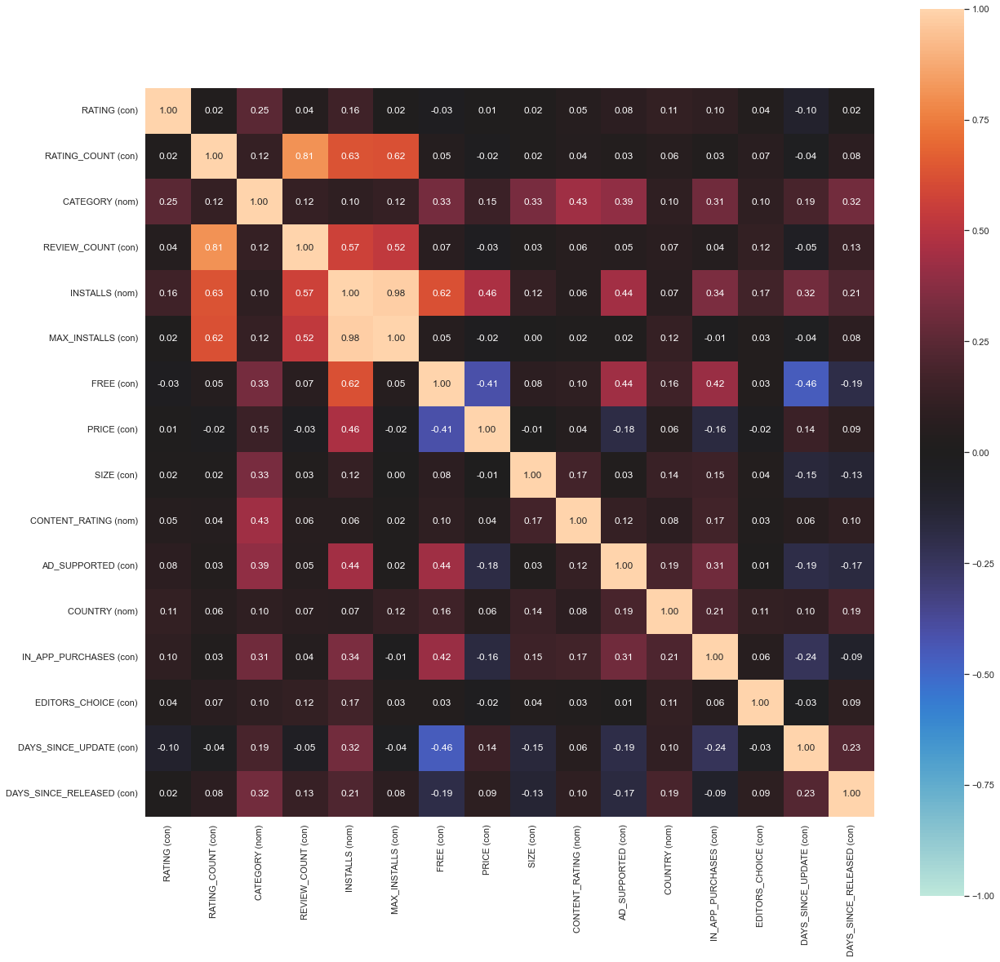

In [35]:
jointDf = df[['RATING','RATING_COUNT', 'CATEGORY', 'REVIEW_COUNT', 'INSTALLS', 'MAX_INSTALLS', 'FREE', 'PRICE', 'SIZE', 'CONTENT_RATING', 'AD_SUPPORTED', 'COUNTRY', 'IN_APP_PURCHASES', 'EDITORS_CHOICE', 'DAYS_SINCE_UPDATE', 'DAYS_SINCE_RELEASED']]
nominal.associations(jointDf, figsize = (20, 20), mark_columns=True);


Dython will automatically find which features are categorical and which are numerical, compute a relevant measure of association between each and every feature, and plot it all as an easy-to-read heat-map. <br>
It will then calculate the correlation/strength-of-association of features in data-set with both categorical and continuous features.

#### The function below will find the number of outliers and the upper and lower limit. And remove those outliers and return the new dataframe. 
#### The second function does the same thing but it will take in 2 fields.

In [36]:
def Outliers(frame, col):
    Q1 = frame[col].quantile(0.25)
    Q3 = frame[col].quantile(0.75)
    IQR = Q3-Q1
    upp_lim = Q3 + 1.5*IQR
    low_lim = Q1 - 1.5*IQR    
    count = 0
    for x in frame[col]:
        if ((x > upp_lim) or (x < low_lim)): count += 1;
    print(f"There is {count} outliers in \"{col}\" field.")
    print(f"{col} upper limit: ", upp_lim)
    print(f"{col} lower limit: ", low_lim)
    return frame[frame[col] < upp_lim]

def Outliers2(frame, col1, col2):
    Q1a = frame[col1].quantile(0.25)
    Q3a = frame[col1].quantile(0.75)
    IQRa = Q3a-Q1a
    upp_lim1 = Q3a + 1.5*IQRa
    low_lim1 = Q1a - 1.5*IQRa    
    count1 = 0
    for x in frame[col1]:
        if ((x > upp_lim1) or (x < low_lim1)): count1 += 1;
    print(f"There is {count1} outliers in \"{col1}\" field.")
    print(f"{col1} upper limit: ", upp_lim1)
    print(f"{col1} lower limit: ", low_lim1)
    
    Q1b = frame[col2].quantile(0.25)
    Q3b = frame[col2].quantile(0.75)
    IQRb = Q3b-Q1b
    upp_lim2 = Q3b + 1.5*IQRb
    low_lim2 = Q1b - 1.5*IQRb    
    count2 = 0
    for x in frame[col2]:
        if ((x > upp_lim2) or (x < low_lim2)): count2 += 1;
    print(f"There is {count2} outliers in \"{col2}\" field.")
    print(f"{col2} upper limit: ", upp_lim2)
    print(f"{col2} lower limit: ", low_lim2)
    return frame[(frame[col1] < upp_lim1) & (frame[col2] < upp_lim2)]

## `RATING` EDA

### What is the rating distribution like on Google PlayStore? 

In [37]:
Ratings = df[['1_STAR_RATINGS','2_STAR_RATINGS','3_STAR_RATINGS','4_STAR_RATINGS','5_STAR_RATINGS']]
RatingsCount = pd.DataFrame(Ratings.sum(axis=0))
RatingsCount.columns = ['Count']
fig = px.bar(RatingsCount, x='Count', width=800, height=400)
fig.show()

### Let's find the average rating of an app.


In [38]:
fig = px.histogram(df, x = "RATING", width=800, height=400)
print("The average rating of an app is: ", df['RATING'].mean())
fig.show()

The average rating of an app is:  4.1587440980651404


### `RATING` VS `EDITORS_CHOICE`

In [39]:
fig = px.box(df, x = "RATING", color = "EDITORS_CHOICE", width=800, height=400)
fig.show()

It seems like we can be confident that those with rating < 3 are not editor's choice. But from rating > 4 onwards, we can't make accurate prediction from what we have now. 

### `RATING` VS `FREE`


What's the distribution of free apps and paid apps?

In [40]:
fig1 = go.Histogram(x = df["FREE"])
fig2 = go.Box(x = df["RATING"], y = df["FREE"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

### `RATING` VS `AD_SUPPORTED`

In [41]:
fig1 = go.Histogram(x = df["AD_SUPPORTED"])
fig2 = go.Box(x = df["RATING"], y = df["AD_SUPPORTED"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

Suprisingly, the distribution between these 2 are very even, and it's beneficial to our machine learning later.

### `RATING` VS `CONTENT_RATING` 

In [42]:
print(df["CONTENT_RATING"].value_counts())
fig1 = go.Histogram(x = df["CONTENT_RATING"])
fig2 = go.Box(x = df["RATING"], y = df["CONTENT_RATING"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

Everyone           12668
Teen                2929
Everyone 10+         989
Mature 17+           856
Adults only 18+       27
Name: CONTENT_RATING, dtype: int64


There's a obvious concentration of the app's rating that are for adults only. As for the apps that are for everyone, it's spread out widely across the rating spectrum. 

### `RATING` VS `IN_APP_PURCHASES`

In [43]:
edited_df = Outliers(df, "MAX_INSTALLS")
fig1 = go.Histogram(x = edited_df["IN_APP_PURCHASES"])
fig2 = go.Box(x = edited_df["RATING"], y = edited_df["IN_APP_PURCHASES"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

There is 2687 outliers in "MAX_INSTALLS" field.
MAX_INSTALLS upper limit:  14824491.0
MAX_INSTALLS lower limit:  -8791461.0


### `RATING` VS `DAYS_SINCE_UPDATE`

In [44]:
fig1 = go.Box(x = df["DAYS_SINCE_UPDATE"], orientation = "h")
fig2 = go.Histogram(x = df["DAYS_SINCE_UPDATE"])
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

You might think this is a very skewed data. But in fact, it's very logical. Because apps should be updated frequently, hence the "lower days" section will be more crowded. BUT!
Let's remove the outliers~

In [45]:
edited_df = Outliers(df, "DAYS_SINCE_UPDATE")

There is 2462 outliers in "DAYS_SINCE_UPDATE" field.
DAYS_SINCE_UPDATE upper limit:  423.5
DAYS_SINCE_UPDATE lower limit:  -236.5


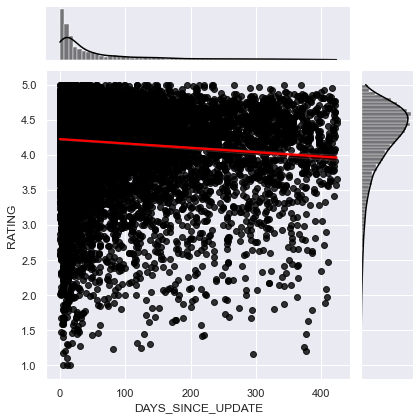

In [46]:
jointDf = edited_df[['DAYS_SINCE_UPDATE', 'RATING']]
sb.jointplot(data = jointDf, x="DAYS_SINCE_UPDATE", y="RATING", kind="reg", color = 'black', line_kws={"color": "red"})

This means that if the longer it took since the last update, we are expecting the app to have a lower rating due to low maintenance of the app.

### `RATING` VS `REVIEW_COUNT`


Text(0.5, 1.0, 'Distribution of Review Count')

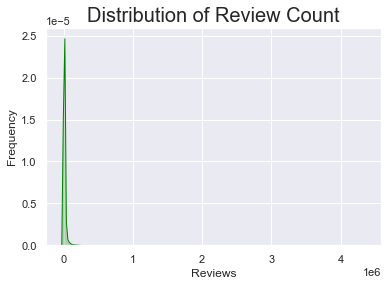

In [47]:
f = sb.kdeplot(df['REVIEW_COUNT'], color="Green", shade = True)
f.set_xlabel("Reviews")
f.set_ylabel("Frequency")
plt.title('Distribution of Review Count',size = 20)

This graph so skewed! We need to clean it by removing outliers.

In [48]:
edited_df = Outliers(df, "REVIEW_COUNT")

There is 2719 outliers in "REVIEW_COUNT" field.
REVIEW_COUNT upper limit:  8067.5
REVIEW_COUNT lower limit:  -4728.5


Text(0.5, 1.0, 'Distribution of Review Count')

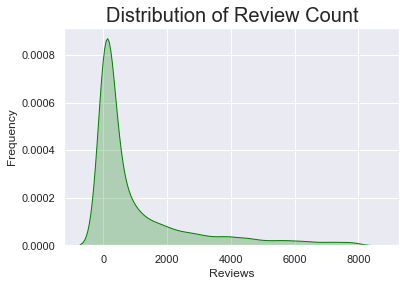

In [49]:
f = sb.kdeplot(edited_df['REVIEW_COUNT'], color="Green", shade = True)
f.set_xlabel("Reviews")
f.set_ylabel("Frequency")
plt.title('Distribution of Review Count',size = 20)

Now, that's more like it. A better presentation of how many reviews get. Although it's still positively skewed...

Text(0.5, 1.0, 'Rating VS Reviews Count')

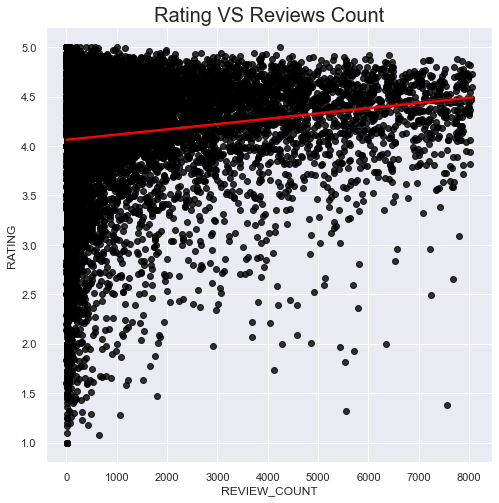

In [50]:
plt.figure(figsize = (8, 8))
sb.regplot(x="REVIEW_COUNT", y="RATING", color = 'black', data=edited_df, line_kws={"color":"red"});
plt.title('Rating VS Reviews Count',size = 20)

### `RATING` VS `SIZE`


In [51]:
def num_plots(df, col, title, xlabel):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(12,5),gridspec_kw={"height_ratios": (.2, .8)})
    ax[0].set_title(title,fontsize=18)
    sb.boxplot(x=col, data=df, ax=ax[0])
    ax[0].set(yticks=[])
    sb.histplot(x=col, data=df, ax=ax[1], bins = 50)
    ax[1].set_xlabel(xlabel, fontsize=16)
    plt.tight_layout()
    plt.show()

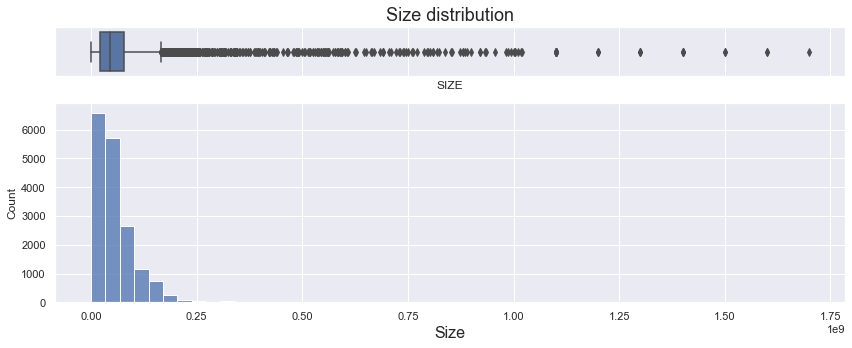

In [52]:
num_plots(df, 'SIZE', 'Size distribution', 'Size')

Text(0.5, 1.0, 'Rating VS Size')

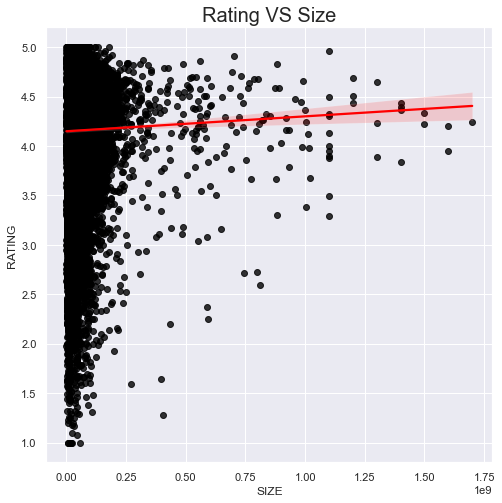

In [53]:
plt.figure(figsize = (8, 8))
sb.regplot(x="SIZE", y="RATING", data=df, color = 'black', line_kws={"color":"red"});
plt.title('Rating VS Size',size = 20)

Remove outliers.

In [54]:
edited_df = Outliers(df, "SIZE")

There is 690 outliers in "SIZE" field.
SIZE upper limit:  165000000.0
SIZE lower limit:  -67000000.0


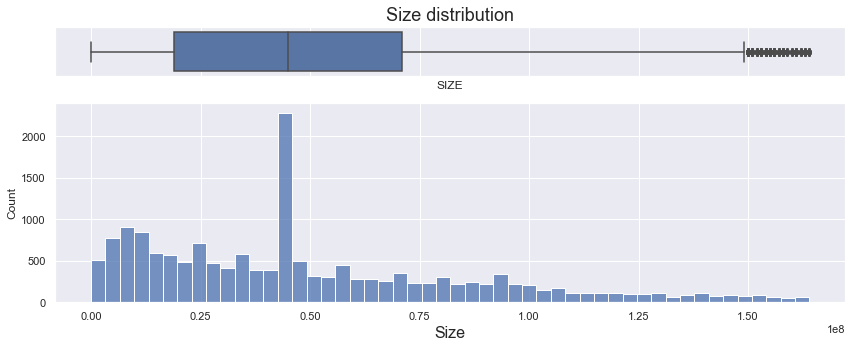

In [55]:
num_plots(edited_df, 'SIZE', 'Size distribution', 'Size')

Text(0.5, 1.0, 'Rating VS Size')

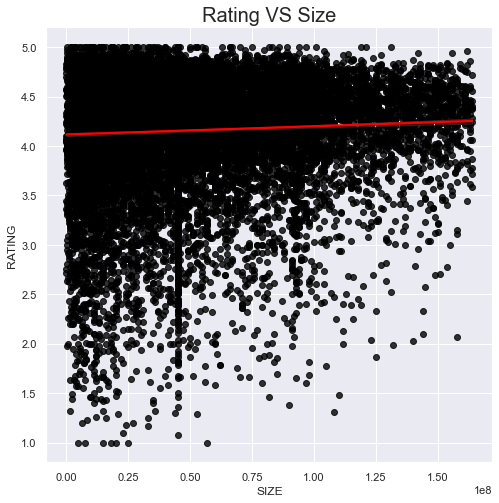

In [56]:
plt.figure(figsize = (8, 8))
sb.regplot(x="SIZE", y="RATING", data=edited_df, color = 'black', line_kws={"color":"red"});
plt.title('Rating VS Size',size = 20)

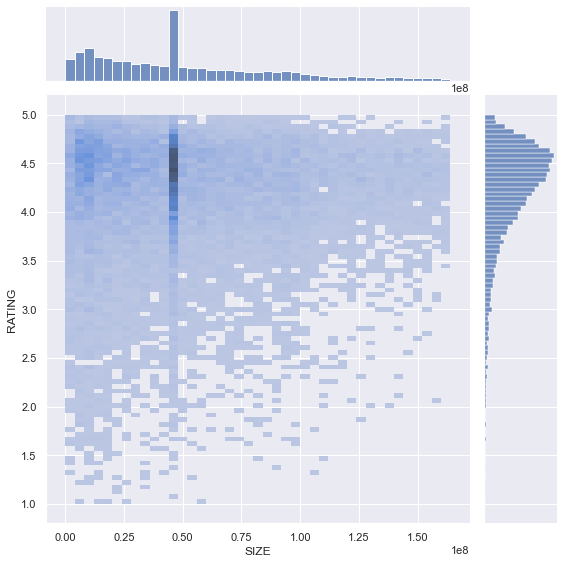

In [57]:
sb.jointplot(data = edited_df, x = "SIZE", y = "RATING", height = 8, kind = "hist")

In this dataset, we have the most frequent data are those around 50 MB and it's rated around 4.50.

### `RATING` VS `PRICE`

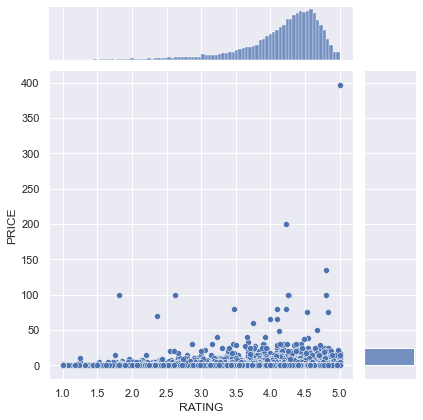

In [58]:
jointDF2 = df[["RATING", "PRICE"]]
sb.jointplot(data = jointDF2, x = "RATING", y = "PRICE", height = 6)

Let's observe closely to the distribution within price < 50

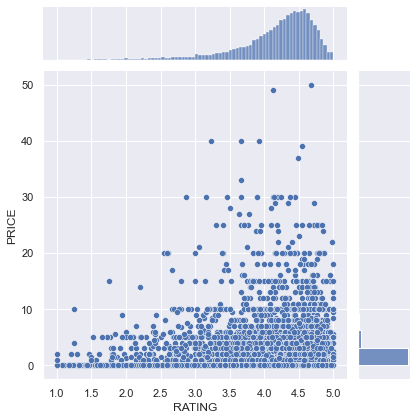

In [59]:
price_less_than_50 = df[df["PRICE"] < 50]
sb.jointplot(data = price_less_than_50, y = "PRICE", x = "RATING", height=6)

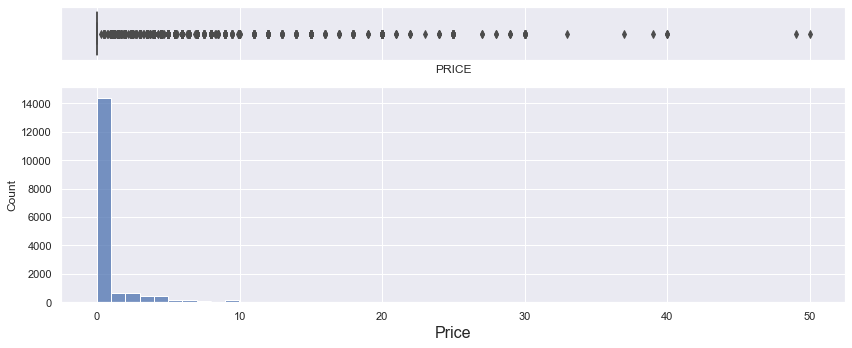

In [60]:
num_plots(price_less_than_50, "PRICE", "", "Price")

<AxesSubplot:xlabel='RATING', ylabel='PRICE'>

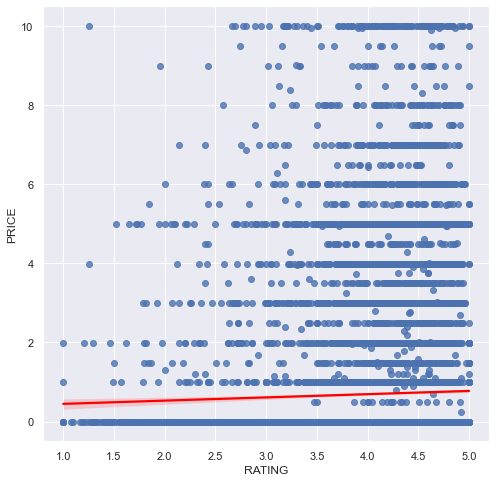

In [61]:
temp = df[df["PRICE"]<10]
plt.figure(figsize = (8, 8))
sb.regplot(y = "PRICE", x = "RATING", data = temp, line_kws={"color": "red"})

## `CONTENT RATING` EDA

## `INSTALLS` EDA

There are quite a handful of categories in the `INSTALLS` column, we will convert them into less categories.

In [62]:
df['INSTALLS_GROUP'] = 'More than 100M'
df.loc[(df['INSTALLS'] == '1+') | (df['INSTALLS'] == '10+') | (df['INSTALLS'] == '50+') | 
       (df['INSTALLS'] == '100+') | (df['INSTALLS'] == '500+' ) | (df['INSTALLS'] == '1,000+' ) | 
       (df['INSTALLS'] == '5,000+' ) | (df['INSTALLS'] == '10,000+' ),'INSTALLS_GROUP'] = 'Less than 10K'
df.loc[(df['INSTALLS'] == '50,000+') | (df['INSTALLS'] == '100,000+')  | (df['INSTALLS'] == '500,000+') 
       | (df['INSTALLS'] == '1,000,000+')  | (df['INSTALLS'] == '5,000,000+') ,'INSTALLS_GROUP'] = 'Between 10K and 1M'
df.loc[(df['INSTALLS'] == '5,000,000+') | (df['INSTALLS'] == '10,000,000+') | (df['INSTALLS'] == '50,000,000+') 
       | (df['INSTALLS'] == '100,000,000+'),'INSTALLS_GROUP'] = 'Between 1M and 100M'
df['INSTALLS_GROUP'] .value_counts()

Between 10K and 1M     8800
Between 1M and 100M    4636
Less than 10K          3930
More than 100M          103
Name: INSTALLS_GROUP, dtype: int64

Text(0.5, 1.0, 'Distribution of INSTALLS GROUP')

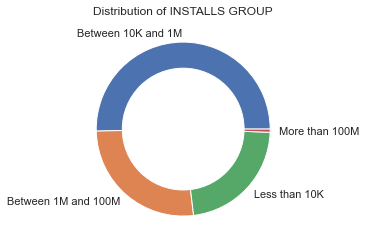

In [63]:
label = ['Between 10K and 1M', 'Between 1M and 100M', 'Less than 10K', 'More than 100M']
plt.pie(x = df['INSTALLS_GROUP'].value_counts().to_frame().INSTALLS_GROUP, labels = label)
my_circle=plt.Circle((0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title("Distribution of INSTALLS GROUP")

### `INSTALLS_GROUP` VS `REVIEW_COUNT`

In [64]:
temp = Outliers(df, "REVIEW_COUNT")

There is 2719 outliers in "REVIEW_COUNT" field.
REVIEW_COUNT upper limit:  8067.5
REVIEW_COUNT lower limit:  -4728.5


In [65]:
fig1 = go.Box(x = df["REVIEW_COUNT"], y = df["INSTALLS_GROUP"], orientation = "h")
fig2 = go.Box(x = temp["REVIEW_COUNT"], y = temp["INSTALLS_GROUP"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

There's a significant increase in review count as the apps get more installs. <br> For apps that fall into "More than 100M" reviews, they have better tendency toward the center and are less spread out.<br> Compared to apps that have reviews "between 10K and 1M", the values are scattered across the axis.

### `INSTALLS_GROUP` VS `RATING_COUNT`

In [66]:
temp2 = Outliers(df, "RATING_COUNT")

There is 2704 outliers in "RATING_COUNT" field.
RATING_COUNT upper limit:  139982.0
RATING_COUNT lower limit:  -82818.0


In [67]:
fig1 = go.Box(x = df["RATING_COUNT"], y = df["INSTALLS_GROUP"], orientation = "h")
fig2 = go.Box(x = temp["RATING_COUNT"], y = temp["INSTALLS_GROUP"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=800,
    height=500,
)

### `INSTALLS_GROUP` VS `FREE`

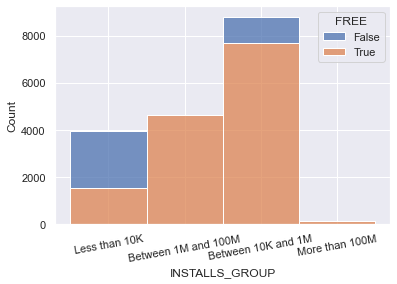

In [68]:
sb.histplot(binwidth=0.5, x="INSTALLS_GROUP", hue="FREE", data=df, stat="count", multiple="stack", )
plt.xticks(rotation = 10)
plt.show()

Looks like more paid apps are installed less. And those that are popularly installed are free.

### `INSTALLS_GROUP` VS `AD_SUPPORTED`

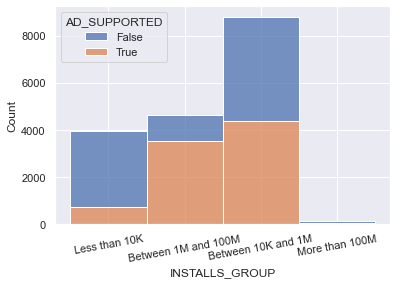

In [69]:
sb.histplot(binwidth=0.5, x="INSTALLS_GROUP", hue="AD_SUPPORTED", data=df, stat="count", multiple="stack")
plt.xticks(rotation = 10)
plt.show()

The majority of apps are ad-supported, especially those that are installed more. This might be due to the developer are relying on advertisement as one of their income. 

### `INSTALLS_GROUP` VS `IN_APP_PURCASES`

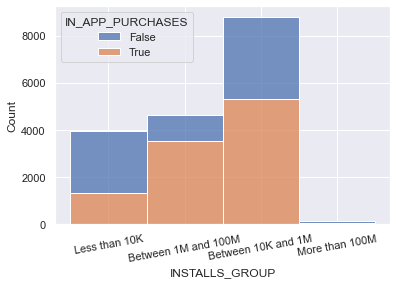

In [70]:
sb.histplot(binwidth=0.5, x="INSTALLS_GROUP", hue="IN_APP_PURCHASES", data=df, stat="count", multiple="stack")
plt.xticks(rotation = 10)
plt.show()

It's quite common to have in app purchases for games that are popular. 

## Miscellaneous EDA

### `PRICE` EDA

Create categories for `PRICE`


In [71]:
df.loc[ df['PRICE'] == 0, 'PriceBand'] = 'Free'
df.loc[(df['PRICE'] > 0) & (df['PRICE'] <= 0.99), 'PriceBand'] = 'cheap'
df.loc[(df['PRICE'] > 0.99) & (df['PRICE'] <= 2.99), 'PriceBand']   = 'not cheap'
df.loc[(df['PRICE'] > 2.99) & (df['PRICE'] <= 4.99), 'PriceBand']   = 'normal'
df.loc[(df['PRICE'] > 4.99) & (df['PRICE'] <= 14.99), 'PriceBand']   = 'expensive'
df.loc[(df['PRICE'] > 14.99) & (df['PRICE'] <= 29.99), 'PriceBand']   = 'too expensive'
df.loc[(df['PRICE'] > 29.99), 'PriceBand']  = 'FXXXing expensive'
df[['PriceBand', 'RATING']].groupby(['PriceBand']).mean()

,RATING
PriceBand,
FXXXing expensive,3.978817
Free,4.150193
cheap,4.111748
expensive,4.217975
normal,4.205860
not cheap,4.203709
too expensive,4.175401


In [72]:
fig = px.box(df, x = "RATING", color = "PriceBand", width=800, height=400)
fig.show()

Let's count the outliers for each category.

### `CATEGORY` EDA

In [73]:
df["CATEGORY"].unique()

array(['Lifestyle', 'Puzzle', 'Racing', 'Role Playing', 'Dating',
       'Beauty', 'Books & Reference', 'Video Players & Editors', 'Tools',
       'Communication', 'Simulation', 'Trivia', 'Entertainment',
       'Libraries & Demo', 'Personalization', 'Finance', 'Education',
       'News & Magazines', 'Music & Audio', 'Card', 'Travel & Local',
       'Social', 'Medical', 'Strategy', 'Arcade', 'Photography', 'Board',
       'Productivity', 'Weather', 'Health & Fitness', 'Business',
       'Action', 'Comics', 'Events', 'Casual', 'Shopping', 'Parenting',
       'Maps & Navigation', 'Sports', 'House & Home', 'Art & Design',
       'Word', 'Casino', 'Food & Drink', 'Adventure', 'Music',
       'Auto & Vehicles', 'Educational'], dtype=object)

Before we start to analyse `CATEGORY`, there are 17 categories that are considered as games, this info is gotten from the app scraper, we will identify them first.

In [74]:
df = pd.read_csv("google_app_scrap_cleaned.csv")
games_categories = ["Puzzle", "Racing", "Role Playing", "Simulation", "Trivia", "Card", "Strategy", 
                    "Arcade", "Action", "Word", "Casino", "Adventure", "Educational", "Sports", "Board", 
                    "Casual", "Music"]
for i in range(len(df)):
    if (df.loc[i, "CATEGORY"] in games_categories):
        df.loc[i, "CATEGORY"] = "Game"

What are the most populated app in Google PlayStore? How many sports app do we have in this dataset?

In [75]:
fig = px.histogram(df, x="CATEGORY").update_xaxes(categoryorder = "total descending")
fig.update_layout(
    width=800,
    height=500,
)
fig.show()

### Performance for each `CATEGORY`

In [76]:
fig = px.box(df, x = "RATING", color = "CATEGORY")
fig.update_layout(
    width=1000,
    height=1200,
    margin=dict(l=20, r=40, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

<a id='singapore EDA'></a>
# Singapore EDA

In [77]:
sg = df.loc[df['COUNTRY'] == 'Singapore']
sg

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
36,1942 🚀 Free classic shooting games,4.587898,Game,73531,3418,1592,3184,5478,59859,5305.0,"5,000,000+",8991266,True,0.0,45000000.0,OneSoft Global PTE. LTD.,"470 NORTH BRIDGE ROAD, SINGAPORE",Everyone,True,Singapore,True,False,488.0,1461.0
37,1945 Air Force: Airplane games,4.698587,Game,1952163,48977,19288,61575,211427,1610896,34945.0,"100,000,000+",112131352,True,0.0,190000000.0,ONESOFT,"470 NORTH BRIDGE ROAD, SINGAPORE",Everyone 10+,True,Singapore,True,False,10.0,1099.0
72,2nd phone number - call & sms,3.250000,Communication,13226,5031,648,0,1048,6499,264.0,"1,000,000+",4492802,True,0.0,24000000.0,High-quality Internet call,"10 Eunos Road 8, 01-123",Everyone,True,Singapore,True,False,112.0,949.0
118,456 Survival Challenge,4.197674,Game,70831,8599,2741,4022,6131,49338,655.0,"10,000,000+",18331140,True,0.0,57000000.0,Azura Global,"Pulau Tekong, Singapore",Teen,True,Singapore,False,False,99.0,144.0
123,4Fun Lite - Live Chat Room,4.100000,Social,40144,7953,0,757,2272,29162,74.0,"10,000,000+",14874675,True,0.0,79000000.0,SpreadFun,3 FRASER STREET， 05-25，DUO TOWER，SINGAPORE,Mature 17+,True,Singapore,True,False,15.0,592.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16455,Word Connect - Fun Word Game,4.739130,Game,6647,95,30,111,1027,5384,1657.0,"100,000+",408445,True,0.0,25000000.0,Classic Puzzzle Games Studio,164 Canberra Drive The Brownstone 768001,Everyone,True,Singapore,False,False,5.0,448.0
16843,Yugto,4.630769,Books & Reference,53165,1227,395,3057,7363,41123,430.0,"1,000,000+",4100184,True,0.0,26000000.0,Dreame Media,"11 WOODLANDS CLOSE 08-20, SINGAPORE",Teen,False,Singapore,True,False,84.0,461.0
16925,Zombie War Idle Defense Game,4.448276,Game,38747,3435,1145,1336,1527,31304,591.0,"5,000,000+",7033818,True,0.0,131000000.0,OneSoft Global PTE. LTD.,"470 NORTH BRIDGE ROAD, SINGAPORE",Everyone 10+,True,Singapore,True,False,4.0,467.0
17125,"iQIYI-Drama, Anime, Show",4.456103,Entertainment,829481,82545,15040,18621,38139,675136,2913.0,"50,000,000+",52838429,True,0.0,45000000.0,iQIYI,"6 SHENTON WAY, 33-00, OUE DOWNTOWN, SINGAPORE",Everyone,True,Singapore,True,False,7.0,1020.0


In [78]:
print("Number of games in Singapore:",len(sg))
print("Number of developers in Singapore:",len(sg["DEVELOPER"].unique()))

Number of games in Singapore: 205
Number of developers in Singapore: 107


It seems like there are developers that created more than one app. Let's find out which developer has the most number of apps developed.

In [79]:
temp = sg.groupby(['DEVELOPER']).size().reset_index(name='COUNT').sort_values(by = 'COUNT', ascending = False)
temp

,DEVELOPER,COUNT
3,AMANOTES PTE LTD,17
61,OneSoft Global PTE. LTD.,14
48,LIHUHU PTE. LTD.,11
23,Dreame Media,8
14,Century Games Pte. Ltd.,7
...,...,...
55,Mods for Minecraft PE by Arata Kenshin,1
54,Modo Global,1
1,ACNGames,1
17,Commandoo Jsc,1


There are 287 apps developed in Singapore. Let's choose the top 20 apps by rating and installs in Singapore.<br>
First, we sort the singapore dataset by installation count and rating.<br>
Then, we take the top 20.

In [80]:
sg_top_20_rated = sg.sort_values(["MAX_INSTALLS", "RATING"], ascending = False)
sg_top_20_rated = sg_top_20_rated.head(20)
sg_top_20_rated

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,CONTENT_RATING,AD_SUPPORTED,COUNTRY,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
12461,SHAREit: Share & File Manager,4.156039,Tools,16968065,2637001,496300,690263,902531,12241970,50315.0,"1,000,000,000+",1810333419,True,0.0,51000000.0,Smart Media4U Technology Pte.Ltd.,2 VENTURE DRIVE 11-30 VISION EXCHANGE SINGAPO...,Everyone,True,Singapore,False,False,1.0,3236.0
5855,Garena Free Fire - Illuminate,3.921184,Game,106026036,23983506,2183863,3267671,5361237,71229759,529596.0,"1,000,000,000+",1183906520,True,0.0,45000000.0,Garena International I,"1 FUSIONOPOLIS PLACE, 17-10, GALAXIS, Singapore",Mature 17+,False,Singapore,True,False,27.0,1552.0
10579,PUBG MOBILE: Aftermath,4.100975,Game,41487293,7662376,839578,1185130,1759563,30040646,795150.0,"500,000,000+",600285723,True,0.0,45000000.0,Level Infinite,10 ANSON ROAD 21-07 INTERNATIONAL PLAZA SING...,Teen,True,Singapore,True,True,55.0,1450.0
8604,Magic Tiles 3,3.935281,Game,2832992,447567,142573,222086,354141,1666625,95367.0,"100,000,000+",484629075,True,0.0,45000000.0,AMANOTES PTE LTD,"24-09 SBF Center, 160 Robinson Road, Singapor...",Everyone,True,Singapore,True,False,11.0,1838.0
14797,Tiles Hop: EDM Rush!,4.168087,Game,3011736,372687,115026,176130,317346,2030547,77783.0,"100,000,000+",448568681,True,0.0,108000000.0,AMANOTES PTE LTD,"24-09 SBF Center, 160 Robinson Road, Singapor...",Teen,True,Singapore,True,False,17.0,1512.0
1496,BeautyPlus-Snap Retouch Filter,4.486609,Photography,4814233,354684,91864,164614,447888,3755183,30404.0,"100,000,000+",430106338,True,0.0,219000000.0,PIXOCIAL TECHNOLOGY (SINGAPORE) PTE. LTD.,"80 Robinson Road 02-00, Singapore 068898",Everyone,True,Singapore,True,False,4.0,3159.0
15947,"WPS Office-PDF,Word,Excel,PPT",4.315896,Productivity,3742515,355120,95942,204036,443824,2643593,56023.0,"100,000,000+",428810135,True,0.0,126000000.0,WPS SOFTWARE PTE. LTD.,6 RAFFLES QUAY 14-06 SINGAPORE,Everyone,True,Singapore,True,False,11.0,3883.0
16109,WeChat,3.748641,Communication,6103916,1400688,216129,380447,626143,3480509,212964.0,"100,000,000+",366352173,True,0.0,396000000.0,WeChat International Pte. Ltd.,"10 Anson Rd, 21-07, International Plaza, Sing...",Everyone,False,Singapore,True,False,11.0,4055.0
10553,PLAYit-All in One Video Player,4.642533,Video Players & Editors,3729916,174007,52639,112895,253109,3137266,13610.0,"100,000,000+",265228236,True,0.0,28000000.0,PLAYIT TECHNOLOGY PTE. LTD.,"60 PAYA LEBAR ROAD, 08-10,PAYA LEBAR SQUARE, S...",Everyone,True,Singapore,True,False,11.0,851.0
6440,"Hago-Talk, Live & Play Games",4.256812,Social,6045675,560542,157685,504453,767615,4055380,6078.0,"100,000,000+",257141759,True,0.0,45000000.0,HAGO,8 TEMASEK BOULEVARD 08-05 SUNTEC TOWER THREE ...,Mature 17+,True,Singapore,True,False,14.0,1267.0


### Singapore Top performing developers
We will determine the reputation of a developer by evaluating their sum of all of their application's max installation count and average rating of each application.

In [81]:
data2 = sg[["APP_NAME", "DEVELOPER", "RATING", "MAX_INSTALLS"]]
avg_rating = data2.groupby(["DEVELOPER"])["RATING"].mean().to_frame()
sum_installs = data2.groupby(["DEVELOPER"])["MAX_INSTALLS"].sum().to_frame()
sg_dev = pd.merge(avg_rating, sum_installs, on = "DEVELOPER")
sg_dev.sort_values(["RATING", "MAX_INSTALLS"], ascending = False).head(10)

,RATING,MAX_INSTALLS
DEVELOPER,,
2021 Yearly Selection Cloud Gaming - Netboom Ltd.,4.888230,19820120
PLAYNEXX GAMES,4.842593,500701
SM Health Team,4.841572,5633058
BOUNCE ENTERTAINMENT COMPANY LIMITED,4.830189,204942
DB RR STUDIO,4.825671,5796815
AlphaPlay Games,4.770000,40542
Wood Puzzle Sudoku Games,4.769841,1226129
Sticker Maker Studio,4.742857,9726600
Classic Puzzzle Games Studio,4.739130,408445


<a id='fang EDA'></a>
# FANG EDA

In [82]:
facebook_apps = df[df["APP_NAME"].str.contains("Facebook")]
amazon_apps = df[df["APP_NAME"].str.contains("Amazon")]
netflix_apps = df[df["APP_NAME"].str.contains("Netflix")]
google_apps = df[df["APP_NAME"].str.contains("Google")]

### How many apps did each company developed?


In [83]:
print("Facebook has developed", len(facebook_apps), "app(s).")
print("Amazon has developed", len(amazon_apps), "app(s).")
print("Netflix has developed", len(netflix_apps), "app(s).")
print("Google has developed", len(google_apps), "app(s).")

Facebook has developed 7 app(s).
Amazon has developed 17 app(s).
Netflix has developed 1 app(s).
Google has developed 52 app(s).


In [84]:
FANG = [facebook_apps, amazon_apps, netflix_apps, google_apps]
stringFANG = ["Facebook", "Amazon", "Netflix", "Google"]

### How's the app rating for the company?

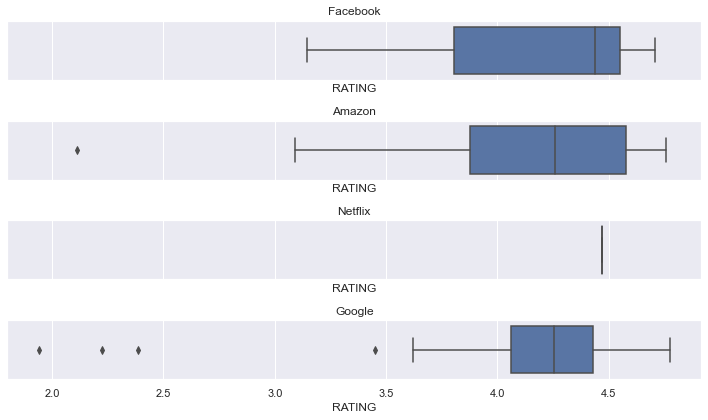

In [85]:
fig, axes = plt.subplots(4, 1, figsize = (10, 6), sharex = True)
x = 0
for i in FANG:
    sb.boxplot(data = i, x = "RATING", ax = axes[x])
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()


### What kind of apps do such great company develop?

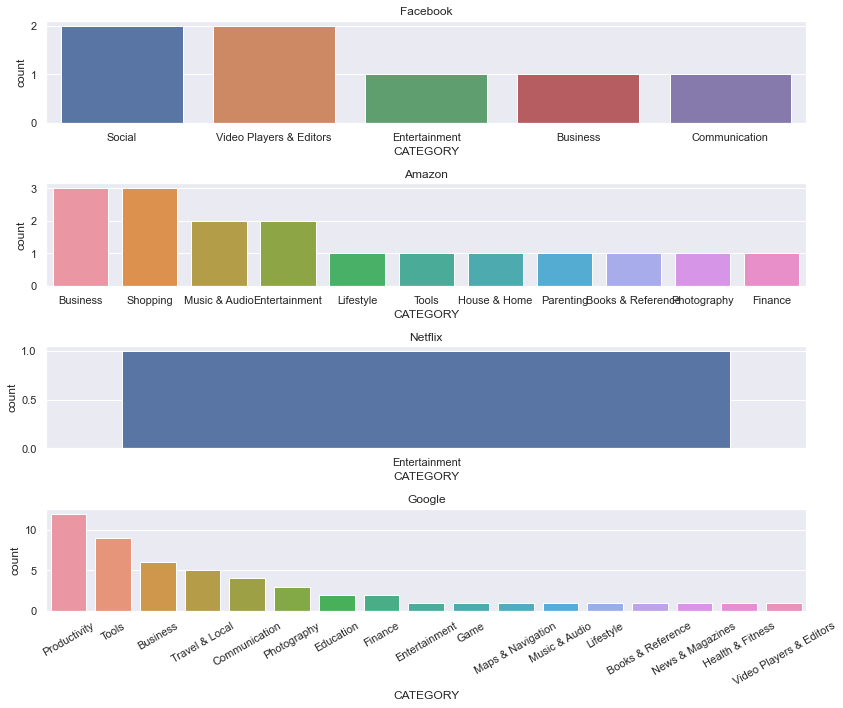

In [86]:
fig, axes = plt.subplots(4, 1, figsize = (12, 10))
x = 0
for i in FANG:
    sb.countplot(x = "CATEGORY", data = i, ax = axes[x] , order = i["CATEGORY"].value_counts().index)
    if (x == 3):
        plt.xticks(rotation = 30)
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()


### Let's find out how each category did in each company, shall we?

In [87]:
fb2 = facebook_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
amz2 = amazon_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
net2 = netflix_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
goog2 = google_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
FANG2 = [fb2, amz2, net2, goog2]

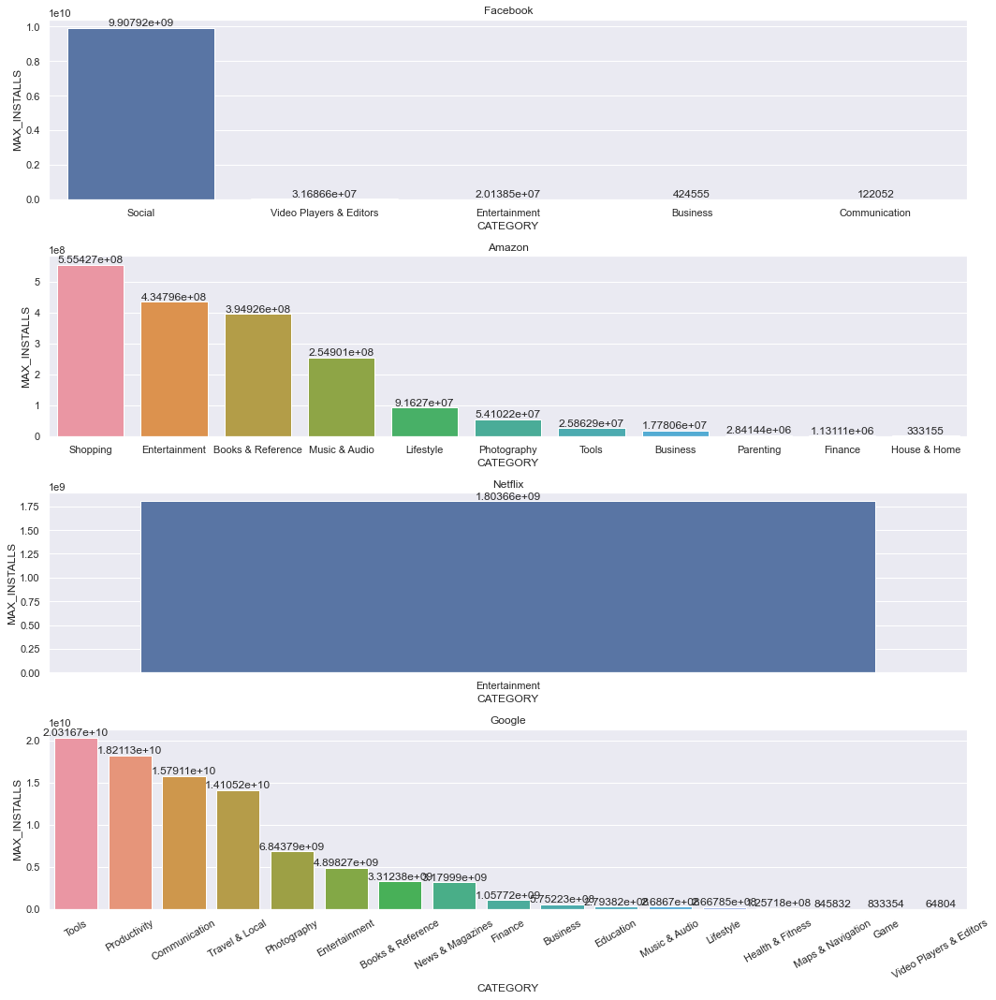

In [88]:
fig, axes = plt.subplots(4, 1, figsize = (15, 15))
x = 0
for i in FANG2:
    ax = sb.barplot(x = "CATEGORY", y = 'MAX_INSTALLS', data = i, ax = axes[x] , order = i.sort_values('MAX_INSTALLS', ascending = False).CATEGORY)
    ax.bar_label(ax.containers[0])
    if (x == 3):
        plt.xticks(rotation = 30)
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()

In fact, it's very intuitive that Facebook's most well-known app falls under the 'Social' category because Facebook is a social media platform. <br>
And Amazon is a e-shopping platform and Netflix is an entertainment platform.<br>And Google is the leading platform in tools, productivity and communication.

<a id ='geospatial analysis'></a>
# Geospatial analysis
We will use the same dataset but will drop those rows without values in the COUNTRY column.

In [89]:
df = pd.read_csv("google_app_scrap_cleaned.csv")
df = df.dropna(subset=['COUNTRY'])

### 1. Comparing the average of max installs of the apps developed by each country.

In [90]:
max_installs_by_mean = pd.DataFrame(df.groupby(["COUNTRY"])["MAX_INSTALLS"].agg("mean"))
max_installs_by_mean.rename(columns={'MAX_INSTALLS': 'MEAN_MAX_INSTALLS'}, inplace = True)
max_installs_by_mean = max_installs_by_mean.nlargest(10,['MEAN_MAX_INSTALLS'])
max_installs_by_mean = max_installs_by_mean.reset_index()
max_installs_by_mean

,COUNTRY,MEAN_MAX_INSTALLS
0,Luxembourg,1.874039e+09
1,Usa,1.278689e+08
2,Ireland,7.368652e+07
3,South Korea,5.526386e+07
4,Oman,5.204643e+07
5,Singapore,4.960978e+07
6,Switzerland,4.265305e+07
7,Cyprus,3.512464e+07
8,France,2.950534e+07
9,Turkey,2.188303e+07


In [91]:
sequence = []
for i in range (1000,0,-100):
    sequence.append(i)
max_installs_by_mean['SIZE'] = sequence
max_installs_by_mean
max_installs_by_mean

,COUNTRY,MEAN_MAX_INSTALLS,SIZE
0,Luxembourg,1.874039e+09,1000
1,Usa,1.278689e+08,900
2,Ireland,7.368652e+07,800
3,South Korea,5.526386e+07,700
4,Oman,5.204643e+07,600
5,Singapore,4.960978e+07,500
6,Switzerland,4.265305e+07,400
7,Cyprus,3.512464e+07,300
8,France,2.950534e+07,200
9,Turkey,2.188303e+07,100


In [92]:
fig = px.bar(max_installs_by_mean, x='COUNTRY', y='MEAN_MAX_INSTALLS')
fig.update_layout(
    width=800,
    height=500,
)
fig.show()

We have grouped the dataset by country and find their mean of max installs per country. Then we will proceed with picking the top 10 countries. <br>
Usa, South Korea, Singapore, France, Finland, China, Turkey and Hong Kong all remains on the list.

In [93]:
fig = px.scatter_geo(max_installs_by_mean, locations="COUNTRY", 
                     hover_name="COUNTRY", size = 'MEAN_MAX_INSTALLS',locationmode = 'country names')
fig.update_layout({
    'geo': {
        'resolution': 50
    }
})
fig.show()

### 2. Comparing the average rating of the apps developed by each country.
We will do the same thing, but this time we will explore on the rating.

In [94]:
rating_by_mean = pd.DataFrame(df.groupby(["COUNTRY"])["RATING"].agg("mean"))
rating_by_mean.rename(columns={'RATING': 'MEAN_RATING'}, inplace = True)

In [95]:
fig = px.box(rating_by_mean, x = "MEAN_RATING",points="all")
fig.update_layout(
    width=800,
    height=500,
)
fig.show()

This figure gives us 2 types of visualizations, boxplot and swarmplot. Which provide us an insight where the majority of data lies in the rating spectrum. Which is 4 to 4.5. <br>
Notice there's a few outliers that have rating that are lower than 3.5. Let's find out which countries are those.

In [96]:
lowest_mean_rating = rating_by_mean[rating_by_mean['MEAN_RATING'] < 3.5]
lowest_mean_rating

,MEAN_RATING
COUNTRY,
Belize,3.288830
Iceland,3.462838
Morocco,2.936170
Uganda,2.200000


In [97]:
rating_by_mean = rating_by_mean.nlargest(10,['MEAN_RATING'])
rating_by_mean = rating_by_mean.reset_index()
rating_by_mean

,COUNTRY,MEAN_RATING
0,Montenegro,4.800969
1,Moldova,4.742574
2,Venezuela,4.670000
3,Albania,4.633178
4,Costa Rica,4.566433
5,Belarus,4.547344
6,Nepal,4.540000
7,Peru,4.535119
8,Tanzania,4.527273
9,Dominican Republic,4.511111


In [98]:
fig = px.bar(rating_by_mean, x='COUNTRY', y='MEAN_RATING')
fig.update_layout(
    width=800,
    height=500,
)
fig.show()

In [99]:
rating_by_mean = rating_by_mean.nlargest(10,['MEAN_RATING'])
sequence = []
for i in range (1000,0,-100):
    sequence.append(i)
rating_by_mean['SIZE'] = sequence
rating_by_mean


,COUNTRY,MEAN_RATING,SIZE
0,Montenegro,4.800969,1000
1,Moldova,4.742574,900
2,Venezuela,4.670000,800
3,Albania,4.633178,700
4,Costa Rica,4.566433,600
5,Belarus,4.547344,500
6,Nepal,4.540000,400
7,Peru,4.535119,300
8,Tanzania,4.527273,200
9,Dominican Republic,4.511111,100


In [100]:
fig = px.scatter_geo(rating_by_mean, locations="COUNTRY", 
                     hover_name="COUNTRY", hover_data=["MEAN_RATING"], size = 'SIZE',locationmode = 'country names')
fig.update_layout({
    'geo': {
        'resolution': 50
    }
})
fig.show()

Compared to the previous map, this map's bubbles are more consistent and we can clearly see which bubble is bigger. Because we introduced a rank metric called SIZE which will change the bubble size according the ranking of the country instead of the mean ratings. 